In [15]:
%load_ext autoreload
%autoreload 2



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
from pathlib import Path

from brain_image.model import NICEModel

cp_path = Path("logs/nice/version_125/checkpoints/nice-epoch=21-val_loss=2.6695.ckpt")

import torch
from lightning import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint


device = "cuda"
dtype = torch.float32

nice_model = NICEModel.load_checkpoint(cp_path, undo_compile=True, preload_latents=False).to(device, dtype=dtype)

logs/nice/version_125/checkpoints/nice-epoch=21-val_loss=2.6695.ckpt
/tmp/tmp6qmhj3e8.pt


In [17]:
from brain_image.reconstruction import ReconstructionPipeline


pipe = ReconstructionPipeline.from_stable_diffusion(device=device, dtype=dtype)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/gasparyanartur/.cache/huggingface/hub/models--lambdalabs--sd-image-variations-diffusers/snapshots/a2a13984e57db80adcc9e3f85d568dcccb9b29fc/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/gasparyanartur/.cache/huggingface/hub/models--lambdalabs--sd-image-variations-diffusers/snapshots/a2a13984e57db80adcc9e3f85d568dcccb9b29fc/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /home/gasparyanartur/.cache/huggingface/hub/models--lambdalabs--sd-image-variations-diffusers/snapshots/a2a13984e57db80adcc9e3f85d568dcccb9b29fc/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/gasparyanartur/.cache/huggingface/hub/models--lambdalabs--sd-image-variations-diffusers/snapshots/a2a13984e57db80adcc9e3f85d568dcccb9b29fc/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error

In [18]:
loader = nice_model.data_module.train_dataloader()

/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [19]:
from brain_image.data import TensorCache, load_image_from_path



batch_size = 4

ex_batch = next(iter(loader))
eeg_data = ex_batch["eeg_data"][:batch_size].to(device, dtype=dtype)
img_path = ex_batch["img_path"][:batch_size]

tensor_cache = TensorCache()

images = torch.stack([load_image_from_path(Path(p)) for p in img_path])[:batch_size].to(device)
print("images", images.shape, images.dtype, images.max(), images.min())

target_img_latents = nice_model._get_batch_from_cache(img_path, "recon", "sd_highlevel", "train").to(device, dtype=dtype)
cond_img_latents = nice_model._get_batch_from_cache(img_path, "align", "unaligned_synclr_16", "train").to(device, dtype=dtype)

images torch.Size([4, 3, 500, 500]) torch.uint8 tensor(255, device='cuda:0', dtype=torch.uint8) tensor(0, device='cuda:0', dtype=torch.uint8)


In [25]:
target_img_latents, cond_img_latents

(tensor([[-0.4004,  0.3929, -0.6535,  ...,  0.0971, -0.5708, -0.3922],
         [-0.3872,  0.1987, -0.2335,  ..., -0.0992, -0.6874,  0.3361],
         [-0.0878,  0.2284, -0.6507,  ...,  0.5573,  0.6504,  0.0778],
         [ 0.0267, -0.5693,  0.1652,  ..., -1.0544,  0.0065,  1.1529]],
        device='cuda:0'),
 tensor([[-0.2463,  0.0895, -0.6622,  ..., -0.1332,  0.1203, -0.3853],
         [-0.1827,  0.3036,  0.1636,  ..., -0.3771,  0.6721, -0.5153],
         [-0.2279, -0.6162, -0.0667,  ..., -0.0488,  0.0780,  0.1760],
         [-0.0022,  1.2995, -0.1284,  ..., -0.1964,  0.2746, -0.1385]],
        device='cuda:0'))

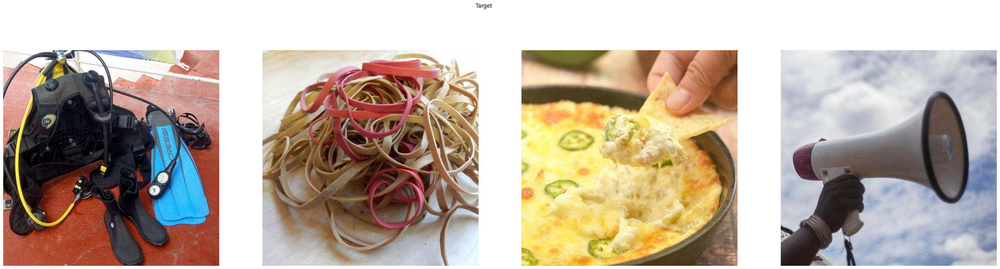

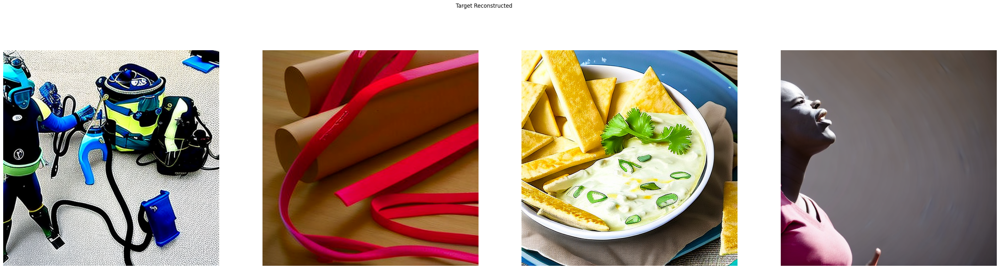

In [20]:
from brain_image.utils import show_image

with torch.no_grad():
    target_recon = pipe.reconstruct_latents(target_img_latents)
    show_image(images, suptitle="Target", transforms=["normalize"] * len(images))
    show_image(target_recon, suptitle="Target Reconstructed")

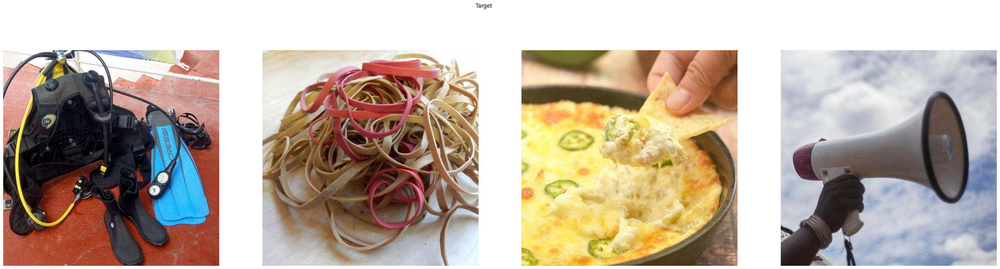

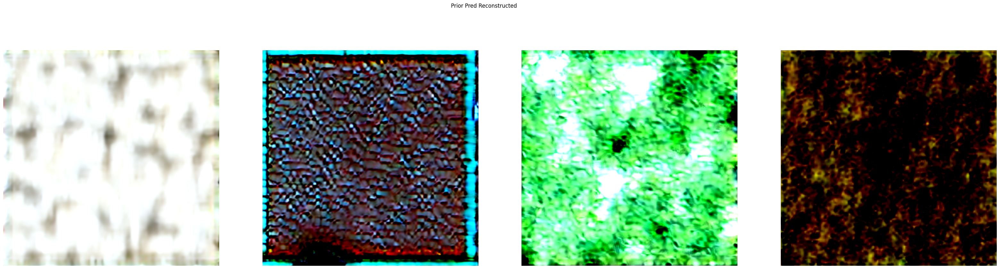

In [ ]:
with torch.no_grad():
    prior = nice_model.prior
    assert prior is not None
    prior_pred = prior.p_sample_loop_ddpm(torch.Size([batch_size, nice_model.config.img_latent_dim]), brain_embedding=cond_img_latents, dtype=dtype, progress_bar=True)
    pred_recon = pipe.reconstruct_latents(prior_pred)

    show_image(images, suptitle="Target", transforms=["normalize"] * len(images))
    show_image(pred_recon, suptitle="Prior Pred Reconstructed")

In [26]:
prior_pred, pred_recon

(tensor([[  2.3095,  31.5314,   4.5908,  ...,  11.8966,   4.0741,  10.8550],
         [ -3.4413,  -1.6066, -13.2788,  ...,  14.7833,  -0.3717,  -9.8104],
         [  1.1935,   4.3454,   3.7889,  ...,  -2.0493,  -7.8932,  -9.3863],
         [ 11.1615,   8.9765,   0.4137,  ...,  -3.5118,   8.3408,   2.6151]],
        device='cuda:0'),
 tensor([[[[0.9256, 0.9769, 0.9824,  ..., 0.4211, 0.4171, 0.4718],
           [0.9703, 0.9949, 0.9807,  ..., 0.4230, 0.4132, 0.4322],
           [0.9902, 0.9831, 1.0000,  ..., 0.4838, 0.4472, 0.4639],
           ...,
           [0.9860, 0.9548, 0.9767,  ..., 0.7269, 0.6300, 0.6002],
           [0.9651, 0.9221, 0.9360,  ..., 0.6815, 0.6094, 0.6015],
           [0.9212, 0.9629, 1.0000,  ..., 0.7432, 0.6695, 0.6677]],
 
          [[0.9853, 1.0000, 1.0000,  ..., 0.4403, 0.4636, 0.4706],
           [1.0000, 1.0000, 1.0000,  ..., 0.3916, 0.4299, 0.4292],
           [1.0000, 1.0000, 1.0000,  ..., 0.4441, 0.4572, 0.4511],
           ...,
           [1.0000, 1.0000,